# Camera Calibration 

In [1]:
# Increase the width to full screen.
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

## See All Images

In [3]:
import os
file_names = sorted(os.listdir('./camera_cal'))

In [4]:
image_list = []
for image_file_name in file_names:
    image_list.append(mpimg.imread(os.path.join('./camera_cal', image_file_name)))

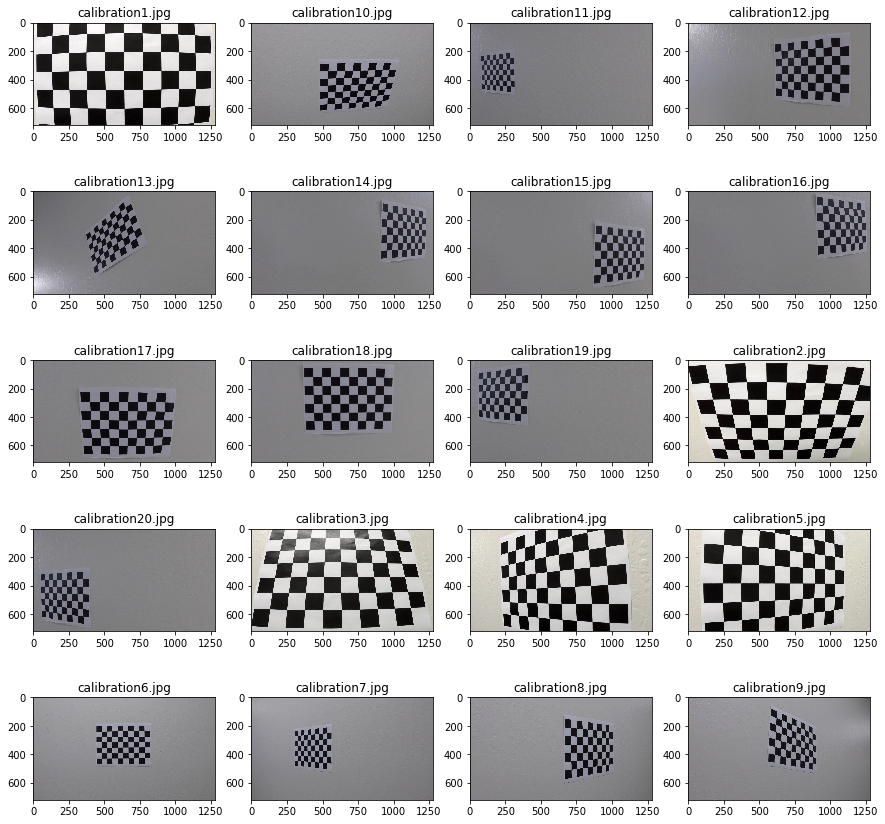

In [5]:
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 5
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    plt.title(file_names[i])
    plt.imshow(image_list[i])
plt.show()

In [6]:
objpoints = []
imgpoints = []
img_with_corners = []
image_name_with_corners = []

objp = np.zeros((6*9,3), np.float32) 
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x and y cordinates.


for image, name in zip(image_list, file_names):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        img_with_corners.append(cv2.drawChessboardCorners(image, (9,6), corners, ret))
        image_name_with_corners.append(name)


## Show all images with Detected corners

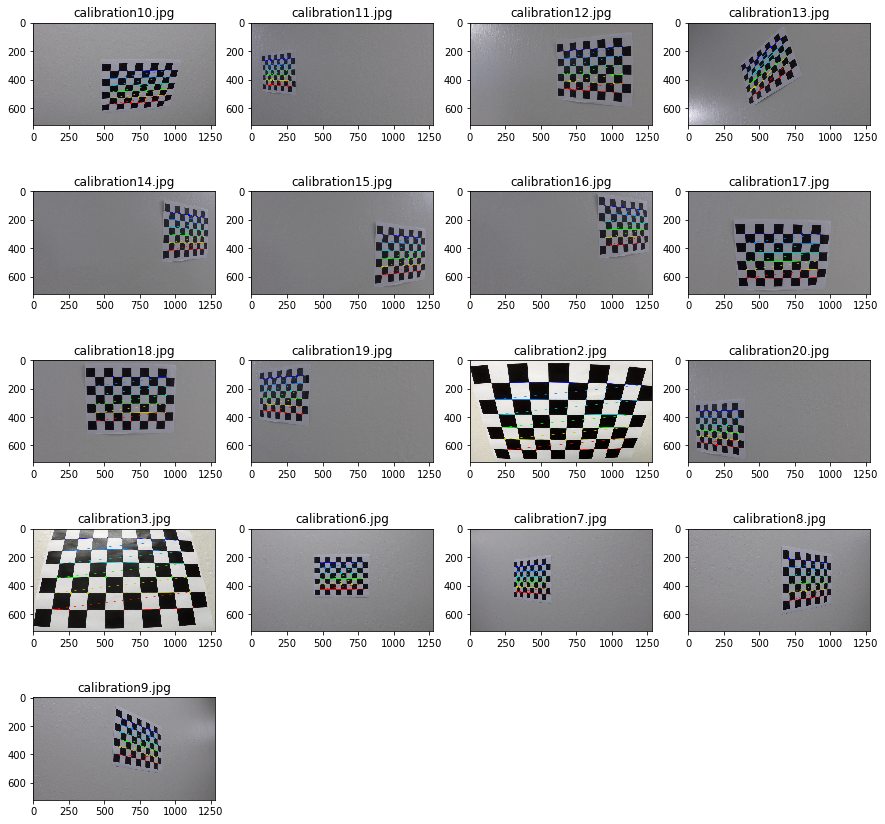

In [7]:
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = len(img_with_corners)/columns + 1

for i in range(0, len(img_with_corners)):
    fig.add_subplot(rows, columns, i+1)
    plt.title(image_name_with_corners[i])
    plt.imshow(img_with_corners[i])
plt.show()

# Run Camera Calibration

In [8]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [9]:
undistorted_image_list = []

for img in image_list:
  undistorted_image_list.append(cv2.undistort(img, mtx, dist, None, mtx))

## Show all undistorted images

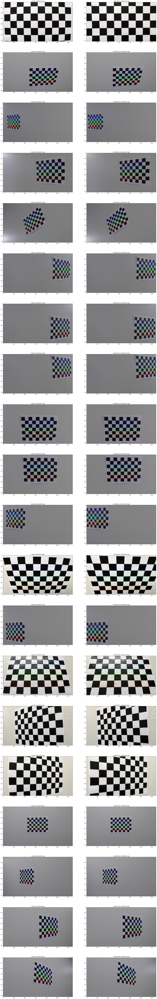

In [10]:
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(30, 200))
columns = 2
rows = 20
for i in range(20):
    fig.add_subplot(rows, columns, 2*i+1)
    plt.title('original_' + file_names[i])
    plt.imshow(image_list[i])
    fig.add_subplot(rows, columns, 2*i+2)
    plt.title('undistorted_-' + file_names[i])
    plt.imshow(undistorted_image_list[i])
    
plt.show()

## Store Camera details for next use

In [11]:
import pickle
pickle.dump( { 'mtx': mtx, 'dist': dist }, open('./pickle_data/camera_calibration.p', 'wb'))